### Exploratory Data Analysis, Clustering
Twitter Outrage Machine (OM); Insight Project- Michele Waters

* It has been observed in popular culture that a large "Twitter ratio" (a ratio of Twitter comments/likes >1) is usually indicative that other Twitter users strongly disagree with a Twitter post. 

* One goal of this project is to see if the ratio can actually be used as a metric of Twitter outrage/ significant negative sentiment.

* Let's explore the tweet data of 100+ Twitter accounts across governement, news, entertainment/sports, and industry and use KMeans clustering on the numeric user acount information to see if we can visualize patterns in these tweets:

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sqlite3
import plotly.express as px

In [2]:
conn=sqlite3.connect('twitter_data_2019_2020.db')
cursor= conn.cursor()

In [3]:
#Create function to query SQL data
def query_data(sql_statement):
    df=pd.read_sql(sql_statement, conn)
    #cursor.execute(sql_statement)
    return df.to_dict('records')

In [4]:
df=pd.DataFrame(query_data('SELECT * from cleaned_merged_twitter_2019'))

In [5]:
df['d_log_ratio']=df.log_ratio.astype('int')

In [6]:
#df.head()

In [7]:
df.columns

Index(['id', 'username', 'text', 'url_attached', 'hashtags', 'reply_to',
       'date', 'formatted_date', 'to', 'link_to_tweet', 'tweet_id', 'retweets',
       'favorites', 'reply_count', 'author_id', 'ratio_comment_like',
       'ratio_comment_retweet', 'log_ratio', 'ratio_richter_likes',
       'ratio_richter_retweets', 'got_ratioed', 'got_richter_ratioed',
       'd_richter_like_ratio', 'd_richter_retweet_ratio', 'account_id',
       'location', 'name', 'description', 'url', 'created_at', 'verified',
       'followers_count', 'friends_count', 'listed_count', 'favourites_count',
       'statuses_count', 'category', 'doy', 'year', 'hour', 'minute', 'second',
       'text_processed', 'cleaned_text', 'encoded_urls', 'url_present',
       'encoded_hashtag', 'hashtag_present', 'num_hashtags', 'd_log_ratio'],
      dtype='object')

In [52]:
# #Plot log_ratio distribution
# fig = plt.figure(figsize = (5,5))
# ax = fig.gca()
# df['log_ratio'].hist(ax=ax) #[df['category']=='4']
# plt.show()

Want to visualize reply count as a function of other parameters

In [54]:
#Plot Replies vs. Likes
fig=px.scatter(df, x='favorites', y='reply_count', title='Twitter Replies vs. Favorites/Likes')
fig.show()

In [10]:
# #Plot Replies vs. Retweets
# fig2=px.scatter(df, x='retweets', y='reply_count', title='Twitter Replies vs. Retweets')
# fig2.show()

In [11]:
# #Plot 3d visualization of replies vs. likes and retweets, visualize categories (i.e. government:1, news:2, entertainment/athletes:3, industry:4)
# fig3 = px.scatter_3d(df, x='favorites', y='reply_count', z='retweets',
#               color='category', title='Favorites, Retweets, Replies ')
# fig3.show()

In [12]:
# import matplotlib.pyplot as plt
# df.plot(kind="scatter", x="favorites", y="retweets", alpha=0.4,
#             label="tweets",
#             c="reply_count", cmap=plt.get_cmap("jet"), colorbar=True,
#             figsize=(15,7))
# plt.legend()

There appear to be several outliers, which do not seem to generate a lot of comments

In [13]:
df_gated=df[(df.favorites<(0.9*10**6))&(df.retweets<(0.3*10**6))]

In [14]:
# df_gated.plot(kind="scatter", x="favorites", y="retweets", alpha=0.6,
#             label="tweets",
#             c="reply_count", cmap=plt.get_cmap("jet"), colorbar=True,
#             figsize=(15,7))
# plt.legend()
# plt.show()

In [15]:
df_outliers=df[~(df.favorites<(0.9*10**6))&(df.retweets<(0.3*10**6))]

In [16]:
#df_outliers.head()

It appears safe to remove these outliers; they appear to represent significantly positive/agreement responses, not the negative responses we are looking for

In [17]:
df_gated.columns

Index(['id', 'username', 'text', 'url_attached', 'hashtags', 'reply_to',
       'date', 'formatted_date', 'to', 'link_to_tweet', 'tweet_id', 'retweets',
       'favorites', 'reply_count', 'author_id', 'ratio_comment_like',
       'ratio_comment_retweet', 'log_ratio', 'ratio_richter_likes',
       'ratio_richter_retweets', 'got_ratioed', 'got_richter_ratioed',
       'd_richter_like_ratio', 'd_richter_retweet_ratio', 'account_id',
       'location', 'name', 'description', 'url', 'created_at', 'verified',
       'followers_count', 'friends_count', 'listed_count', 'favourites_count',
       'statuses_count', 'category', 'doy', 'year', 'hour', 'minute', 'second',
       'text_processed', 'cleaned_text', 'encoded_urls', 'url_present',
       'encoded_hashtag', 'hashtag_present', 'num_hashtags', 'd_log_ratio'],
      dtype='object')

In [18]:
# df_gated.plot(kind="scatter", x="favorites", y="retweets", alpha=0.6,
#             label="tweets",
#             c="d_log_ratio", cmap=plt.get_cmap("jet"), colorbar=True,
#             figsize=(15,7))
# plt.legend()
# plt.show()

In [19]:
##Look at tweets that got ratioed
# fig3=px.scatter(df_gated, x='favorites', y='reply_count', title='Twitter Replies vs. Favorites/Likes',color='got_ratioed')
# fig3.show()

In [20]:
# fig4=px.scatter(df_gated, x='favorites', y='reply_count', title='Twitter Replies vs. Favorites/Likes',color='log_ratio')
# fig4.show()

In [21]:
# fig5=px.scatter(df_gated, x='favorites', y='reply_count', title='Twitter Replies vs. Favorites/Likes',color='d_richter_like_ratio')
# fig5.show()

In [56]:
# #Look at discrete values for log ratio score using plotly
# fig5=px.scatter(df_gated, x='favorites', y='reply_count', title='Twitter Replies vs. Favorites/Likes',color='d_log_ratio')
# fig5.show()

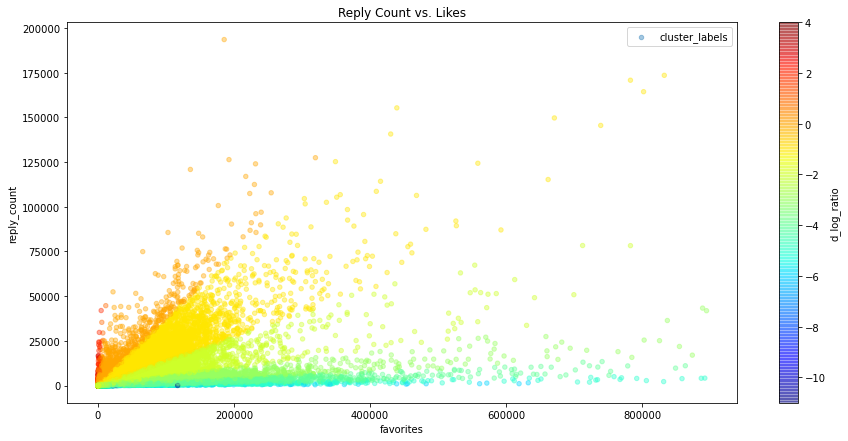

In [62]:
#Look at discrete values for log ratio score using matplotlib
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
num_df.plot(kind="scatter", x="favorites", y="reply_count", alpha=0.4,
            label='cluster_labels',
            c='d_log_ratio', cmap=plt.get_cmap("jet"), colorbar=True,
            figsize=(15,7), title='Reply Count vs. Likes', ax=ax)
plt.legend()
plt.show()

In [23]:
# ##Look at tweets with discrete log ratio score of 4
# df_gated[df_gated['d_log_ratio']==4][['username','text','favorites','retweets', 'reply_count']]

In [24]:
##Look at tweets with discrete log ratio score of 3
#df_gated[df_gated['d_log_ratio']==3][['username','text','favorites','retweets', 'reply_count']]

In [25]:
##Look at text of tweets with discrete log ratio score of 3
#df_gated[df_gated['d_log_ratio']==3]['text'].values

In [26]:
##Look at tweets with discrete log ratio score of 2
#df_gated[df_gated['d_log_ratio']==2][['username','text','favorites','retweets', 'reply_count']]

In [27]:
# #Look at tweets with discrete log ratio score of 2, with reply count less than 50
# df_gated[(df_gated['d_log_ratio']==2) & (df_gated['reply_count']>50)][['username','text','favorites','retweets', 'reply_count']]

In [28]:
# #Look at tweets with discrete log ratio score of above 0 (i.e. ratioed), with reply count less than 50
# df_gated[(df_gated['d_log_ratio']>0) & (df_gated['reply_count']>50)][['username','text','favorites','retweets', 'reply_count']][100:110]

In [29]:
##Look at text for these tweets
#df_gated[(df_gated['d_log_ratio']>0) & (df_gated['reply_count']>50)]['text'].values[:100]

In [30]:
df_gated[(df_gated['d_log_ratio']>0) & (df_gated['reply_count']>50)]['username'].unique()

array(['speakerpelosi', 'kamalaharris', 'nycmayor', 'rodrosenstein',
       'cillizzacnn', 'ac360', 'donlemon', 'brianstelter', 'vanjones68',
       'breitbartnews', 'bariweiss', 'morningmika', 'seanhannity',
       'justinamash', 'sarahpalinusa', 'govchristie', 'piersmorgan',
       'mittromney', 'senatorcollins', 'lisamurkowski', 'senatorloeffler',
       'jerryfalwelljr', 'scottwalker', 'tedcruz', 'randpaul', 'mcuban',
       'jtimberlake', 'droz', 'drdrew', 'drphil', 'tip', 'nike',
       'wellsfargo', 'equifax', 'equinox', 'fedex', 'twitter', 'youtube',
       'natesilver538'], dtype=object)

This gating appears to capture the outrage we seek

In [67]:
#Get indexes for ratios
ratio_index=df_gated[(df_gated['d_log_ratio']>0) & (df_gated['reply_count']>50)].index

Make all ratio values=1, all non-ratios=0

In [68]:
df_gated['ratio_target']=0

/Users/michelewaters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [69]:
#df_gated.head()

In [80]:
##Set 'ratio target' equal to 1 at indexes where d_log_ratio>0 and replies>50
##df_gated.iloc[ratio_index].loc['ratio_target']=1 #This worked originally, but found below worked better
df_gated.at[ratio_index, 'ratio_target'] = 1

In [81]:
#df_gated.ratio_target.value_counts()
df_gated.ratio_target.unique()   

array([0, 1])

In [82]:
df_gated.ratio_target.value_counts()

0    246867
1      2849
Name: ratio_target, dtype: int64

Ratios represent only 1.15% of our gated data

In [36]:
#Percentage of ratios
(2849/246867)*100

1.1540627139309831

### Using Kmeans Clustering

Let's cluster tweets by numerical user account information

In [37]:
#Get all numerical features
num_df=df_gated.select_dtypes('number')

In [38]:
#num_df.head()

In [39]:
num_df.columns

Index(['id', 'tweet_id', 'retweets', 'favorites', 'reply_count', 'author_id',
       'ratio_comment_like', 'ratio_comment_retweet', 'log_ratio',
       'ratio_richter_likes', 'ratio_richter_retweets', 'got_ratioed',
       'got_richter_ratioed', 'd_richter_like_ratio',
       'd_richter_retweet_ratio', 'account_id', 'verified', 'followers_count',
       'friends_count', 'listed_count', 'favourites_count', 'statuses_count',
       'doy', 'year', 'hour', 'minute', 'second', 'encoded_urls',
       'url_present', 'encoded_hashtag', 'hashtag_present', 'num_hashtags',
       'd_log_ratio', 'ratio_target'],
      dtype='object')

In [40]:
#Select features for clustering
selected_features=['verified', 'followers_count','friends_count', 'listed_count', 'favourites_count', 'statuses_count',
                   'doy', 'year', 'hour', 'minute', 'second', 'encoded_urls',
                   'url_present', 'encoded_hashtag', 'hashtag_present', 'num_hashtags']

In [41]:
sel_num_df=num_df[selected_features]

In [42]:
sel_num_df.isna().sum()

verified            0
followers_count     0
friends_count       0
listed_count        0
favourites_count    0
statuses_count      0
doy                 0
year                0
hour                0
minute              0
second              0
encoded_urls        0
url_present         0
encoded_hashtag     0
hashtag_present     0
num_hashtags        0
dtype: int64

In [43]:
from sklearn.cluster import KMeans

In [44]:
#Let's specify 4 clusters
kmean = KMeans(n_clusters=4, init='random') 
kmean.fit(sel_num_df)

KMeans(init='random', n_clusters=4)

In [45]:
cluster_labels = kmean.labels_
cluster_labels[:3]

array([0, 0, 0], dtype=int32)

In [46]:
np.unique(cluster_labels)

array([0, 1, 2, 3], dtype=int32)

In [47]:
#Add our cluster labels to our gated dataframe
sel_num_df['cluster_labels'] = cluster_labels
num_df['cluster_labels'] = cluster_labels
df_gated['cluster_labels']= cluster_labels

/Users/michelewaters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/michelewaters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/michelewaters/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

In [48]:
#sel_num_df.head()

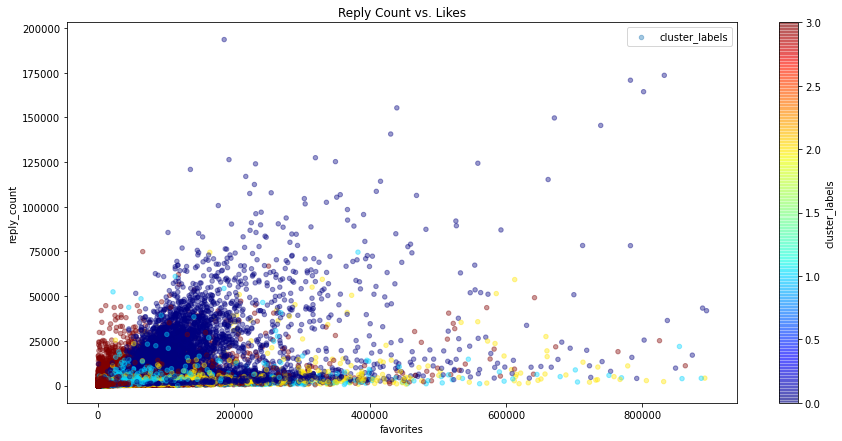

In [60]:
#Plot clusters
fig, ax = plt.subplots()
num_df.plot(kind="scatter", x="favorites", y="reply_count", alpha=0.4,
            label='cluster_labels',
            c='cluster_labels', cmap=plt.get_cmap("jet"), colorbar=True,
            figsize=(15,7), title='Reply Count vs. Likes', ax=ax)
plt.legend()
plt.show()

In [50]:
#df_gated.head()

In [51]:
#Save cluster data to SQL database
df_gated.drop(columns='id').to_sql('merged_twitter_data_gated', conn, index_label='id', if_exists='replace')